In [1]:
import sns
! pip install coco-experiment cocopp scipy scikit-learn matplotlib seaborn pandas numpy ripser tqdm persim scikit-tda seaborn


[notice] A new release of pip is available: 24.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [2]:
from ripser import Rips
from tqdm.auto import tqdm
from persim import PersistenceImager
import numpy as np
from scipy.spatial.distance import cdist
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from utils import axis_transform, volume_transform, get_distance
import cocoex

def perform_experiment(
    suite=None, instance_amount=100, alpha=0.2, kernel_size=0.0002, max_range=1.0, transform_type="axis"
):
    if suite is None:
        suite = cocoex.Suite(
            "bbob",
            f"year: 2009 instances: 1-{instance_amount}",
            f"function_indices: 1-24 " f"dimensions: 2 " f"instance_indices: 1-{instance_amount} ",
        )

    Xs = []
    Ys = []
    persistence_diagrams = []
    images0 = []
    images1 = []
    images2 = []

    pimgr0 = PersistenceImager(
        pixel_size=0.01,
        birth_range=(0.0, 0.01),
        pers_range=(0.0, max_range),
        kernel_params={"sigma": [[kernel_size, 0.0], [0.0, kernel_size]]},
    )
    pimgr1 = PersistenceImager(
        pixel_size=0.01,
        birth_range=(0.0, max_range),
        pers_range=(0.0, max_range),
        kernel_params={"sigma": [[kernel_size, 0.0], [0.0, kernel_size]]},
    )
    pimgr2 = PersistenceImager(
        pixel_size=0.01,
        birth_range=(0.0, max_range),
        pers_range=(0.0, max_range),
        kernel_params={"sigma": [[kernel_size, 0.0], [0.0, kernel_size]]},
    )

    for problem in tqdm(suite):
        # Random Sampling
        X = np.random.uniform(-5, 5, size=(200, 2))
        Y = np.array([problem(x) for x in X])
        if transform_type == "volume":
            X = volume_transform(X)
        elif transform_type == "axis":
            X = axis_transform(X)


        # Apply Transformation (Axis/Volume)
        # X = X / np.abs(X).max(axis=0) # Scaling between -1 and 1
        # X_D = squareform(pdist(X_transformed, metric="euclidean"))
        X_D = cdist(X, X, "euclidean")
        X_D_norm = X_D / np.abs(X_D).max(axis=0)

        # Y = (Y - np.min(Y)) / (np.max(Y) - np.min(Y))
        # Y = ( Y- Y.min() ) / ( Y.max() - Y.min() ) # min-max normalization [0,1]
        # Y_D = squareform(pdist(Y.reshape(-1, 1), metric="euclidean"))
        Y_D = cdist(np.asmatrix(Y).T, np.asmatrix(Y).T, "euclidean")
        Y_D_norm = Y_D / Y_D.max()

        Xs.append(X_D_norm)
        Ys.append(Y_D_norm)

        rips = Rips(maxdim=2, coeff=2, verbose=False)
        distances = get_distance(X_D_norm, Y_D_norm, alpha=alpha)
        diagrams = rips.fit_transform(distances, distance_matrix=True)

        d0 = diagrams[0]
        d1 = diagrams[1]
        d2 = diagrams[2]

        sel0 = np.isfinite(d0.sum(axis=1))
        sel1 = np.isfinite(d1.sum(axis=1))
        sel2 = np.isfinite(d2.sum(axis=1))

        img0 = pimgr0.transform(d0[sel0, :])
        img1 = pimgr1.transform(d1[sel1, :])
        img2 = pimgr2.transform(d2[sel2, :])

        images0.append(img0.flatten())
        images1.append(img1.flatten())
        images2.append(img2.flatten())

    sim0 = cosine_similarity(images0)
    sim1 = cosine_similarity(images1)
    sim2 = cosine_similarity(images2)

    plot_cosine_similarity_heatmap(
        sim0,
        group_size=int(instance_amount),
        title=f"Cosine Similarity Heatmap - H0,  {transform_type or 'no'} transform, $\\alpha$ = {alpha}, kernel_size = {kernel_size}",
        vmin=0.97,
        vmax=1.0,
    )
    plot_cosine_similarity_heatmap(
        sim1,
        group_size=int(instance_amount),
        title=f"Cosine Similarity Heatmap - H1, {transform_type or 'no'} transform, $\\alpha$ = {alpha}, kernel_size = {kernel_size}",
        vmin=0.8,
        vmax=1.0,
    )

    plot_cosine_similarity_heatmap(
        sim2,
        group_size=int(instance_amount),
        title=f"Cosine Similarity Heatmap - H2, {transform_type or 'no'} transform, $\\alpha$ = {alpha}, kernel_size = {kernel_size}",
        vmin=0.3,
        vmax=1.0,
    )
    return images0, images1, images2


def plot_cosine_similarity_heatmap(
    sim,
    group_size=100,
    title="Cosine Similarity Heatmap",
    grid=True,
    vmin=0.9,
    vmax=1.0,
):
    n_items = sim.shape[0]
    n_groups = n_items // group_size

    fig, ax = plt.subplots(figsize=(10, 8))
    im = ax.imshow(sim, cmap="viridis", aspect="auto", vmin=vmin, vmax=vmax)
    plt.colorbar(im, ax=ax, label="Cosine Similarity")
    # ax.set_xticks(range(n_items))
    # ax.set_yticks(range(n_items))
    # ax.set_xticklabels(range(1, n_items + 1), fontsize=8)
    # ax.set_yticklabels(range(1, n_items + 1), fontsize=8)
    ax2 = ax.secondary_xaxis("top")
    # ax3 = ax.secondary_yaxis("right")

    group_positions = [i * group_size + group_size / 2 - 0.5 for i in range(n_groups)]
    group_labels = [f"{i+1}" for i in range(n_groups)]

    ax.set_xticks([])

    ax2.set_xticks(group_positions)
    ax2.set_xticklabels(group_labels, fontsize=12, fontweight="bold")

    ax.set_yticks(group_positions)
    ax.set_yticklabels(group_labels, fontsize=12, fontweight="bold")

    # Add grid lines to separate groups
    if grid:
        for i in range(1, n_groups):
            ax.axhline(i * group_size - 0.5, color="white", linewidth=2)
            ax.axvline(i * group_size - 0.5, color="white", linewidth=2)

    # ax.set_xlabel("Instance", fontsize=12)
    ax.set_ylabel("Function", fontsize=12)
    ax2.set_xlabel("Function", fontsize=12)
    ax.set_title(title, fontsize=14, pad=20)

    plt.tight_layout()
    plt.show()

/Users/leekaijen/Documents/MSCS/thesis/MSc-Thesis-Problem-Embedding-Transfer-Learning/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


100%|██████████| 2400/2400 [11:55<00:00,  3.35it/s]


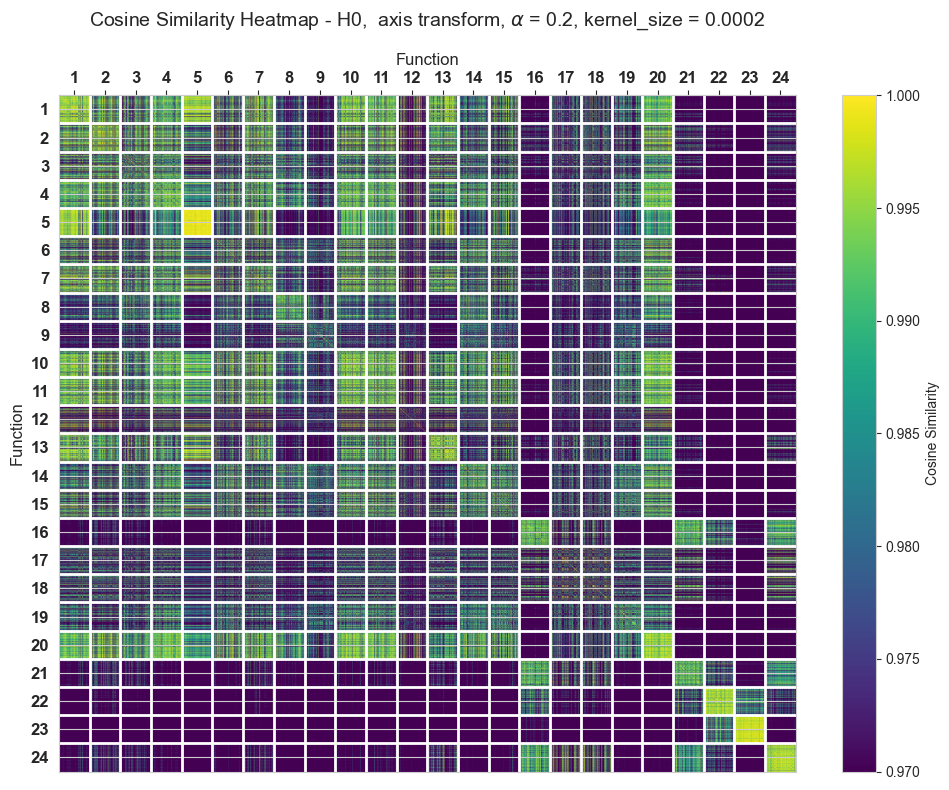

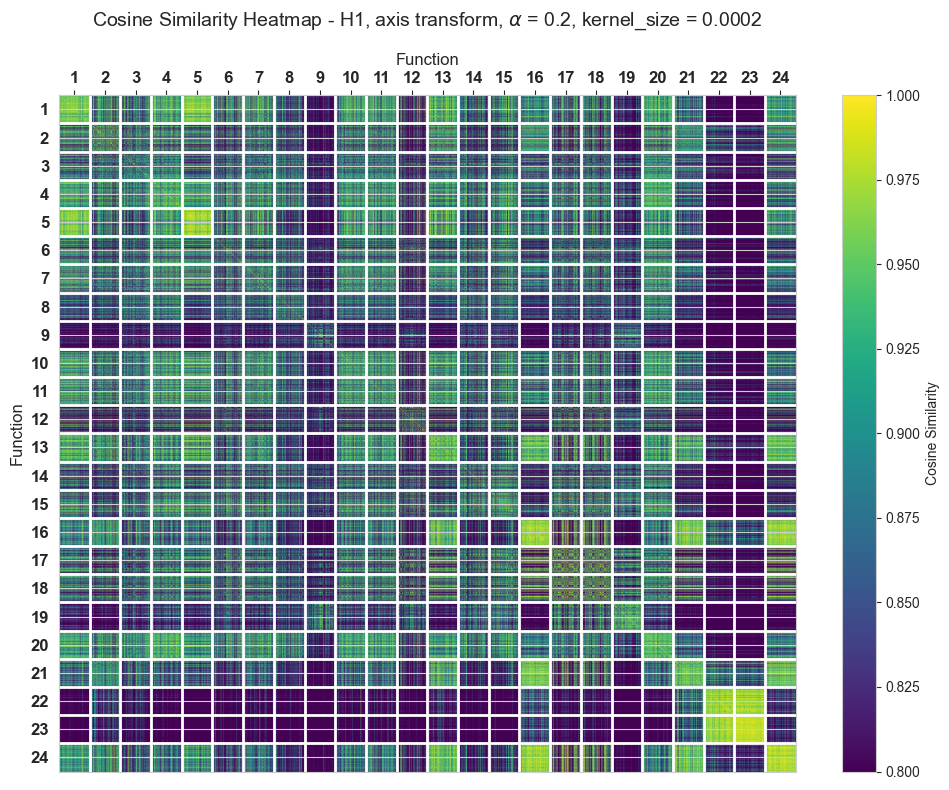

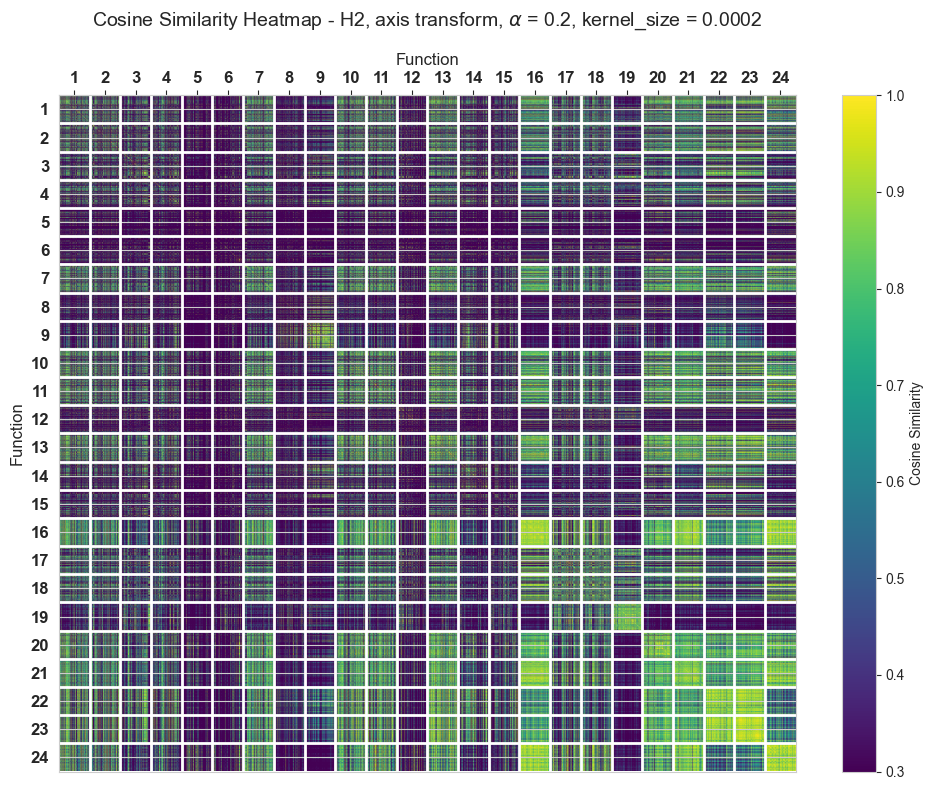

100%|██████████| 2400/2400 [11:51<00:00,  3.37it/s]


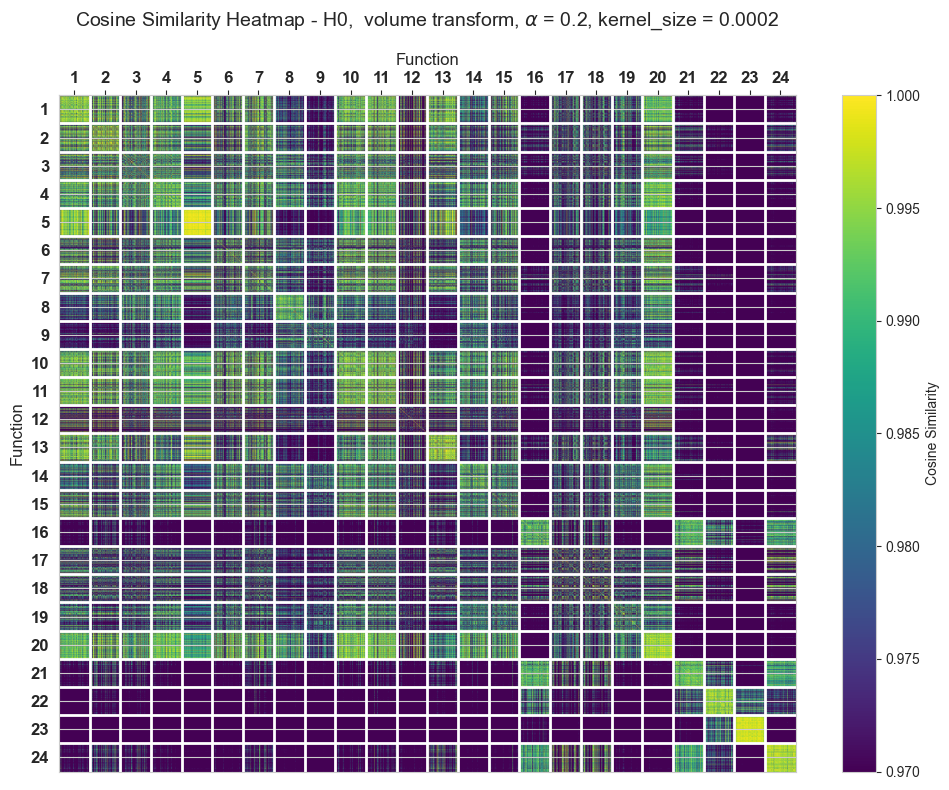

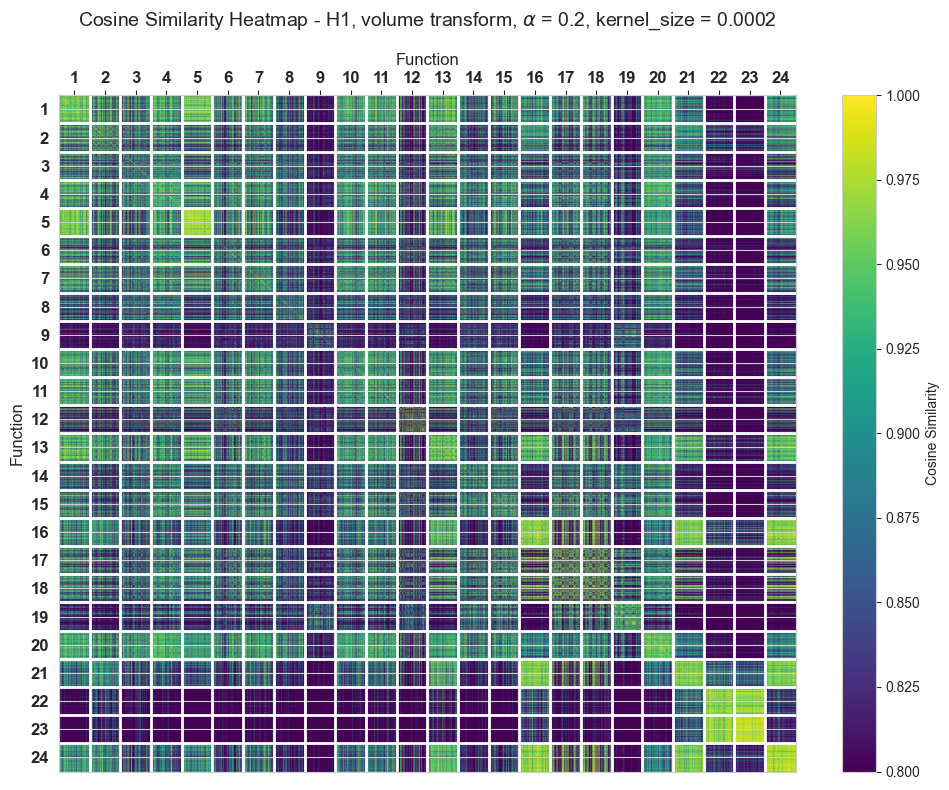

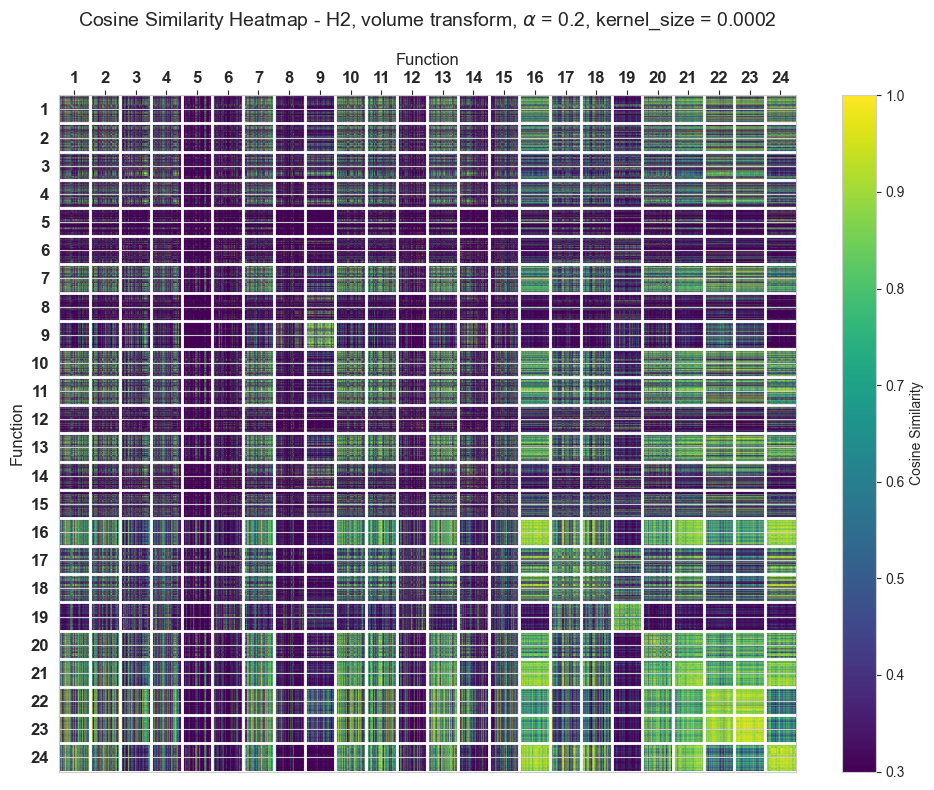

In [3]:
h0_axis, h1_axis, h2_axis = perform_experiment(instance_amount="100", transform_type="axis")
h0_volume, h1_volume, h2_volume = perform_experiment(instance_amount="100", transform_type="volume")

In [4]:
h0_volume_sim = cosine_similarity(h0_volume)
h1_volume_sim = cosine_similarity(h1_volume)
h2_volume_sim = cosine_similarity(h2_volume)

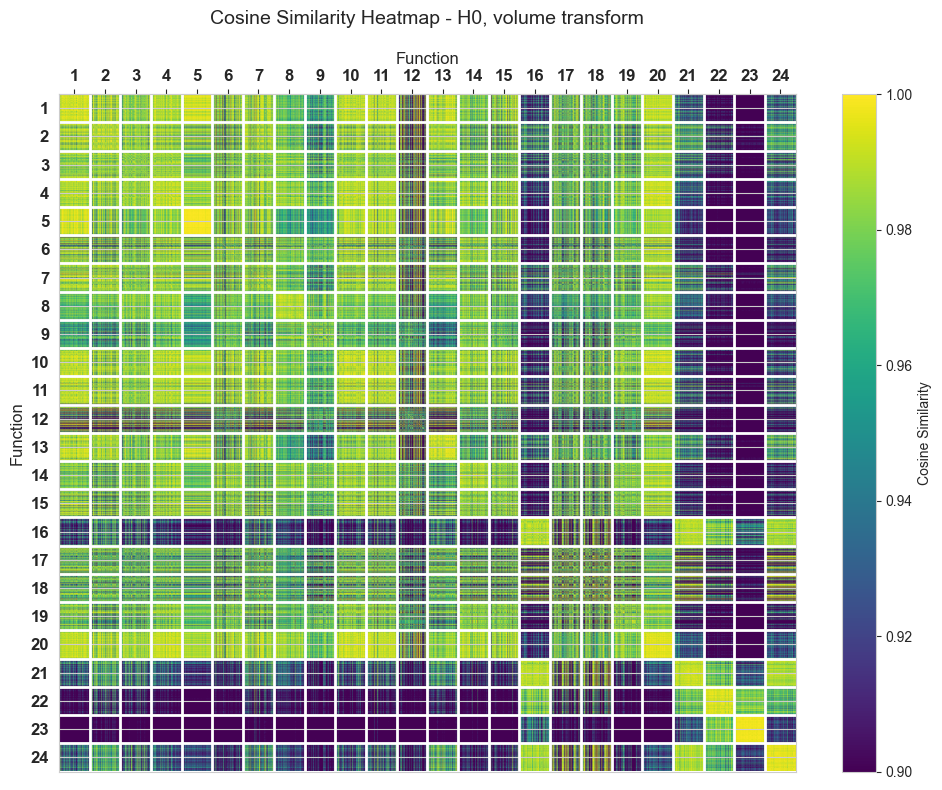

In [5]:
plot_cosine_similarity_heatmap(
    h0_volume_sim,
    group_size=100,
    title="Cosine Similarity Heatmap - H0, volume transform",
)

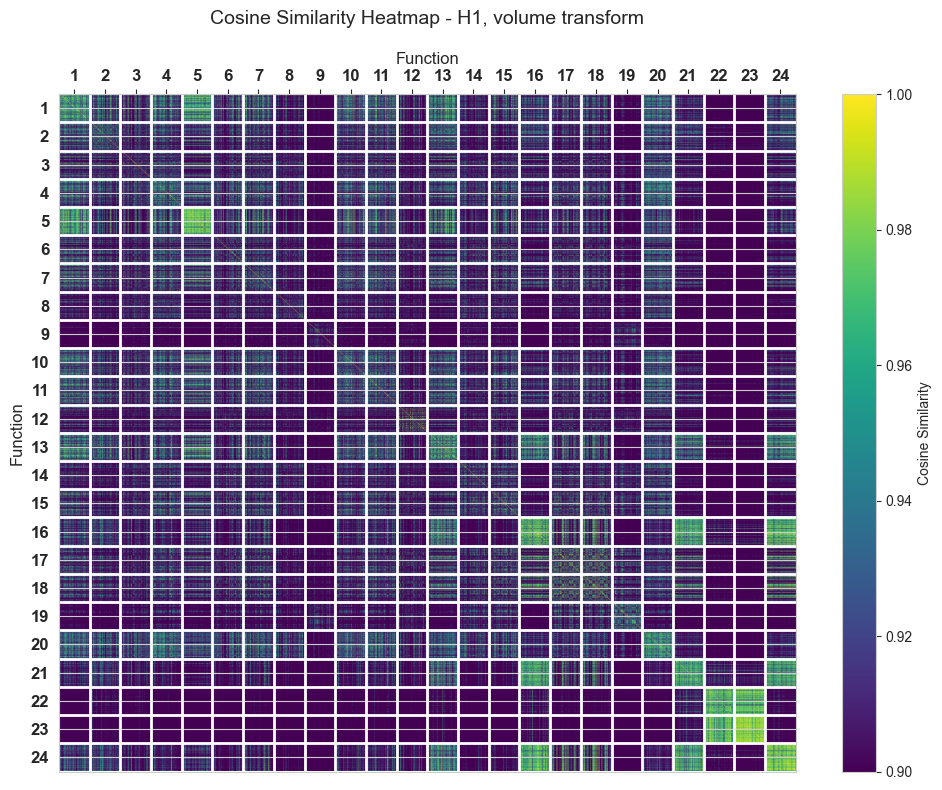

In [6]:
plot_cosine_similarity_heatmap(
    h1_volume_sim,
    group_size=100,
    title="Cosine Similarity Heatmap - H1, volume transform",
)

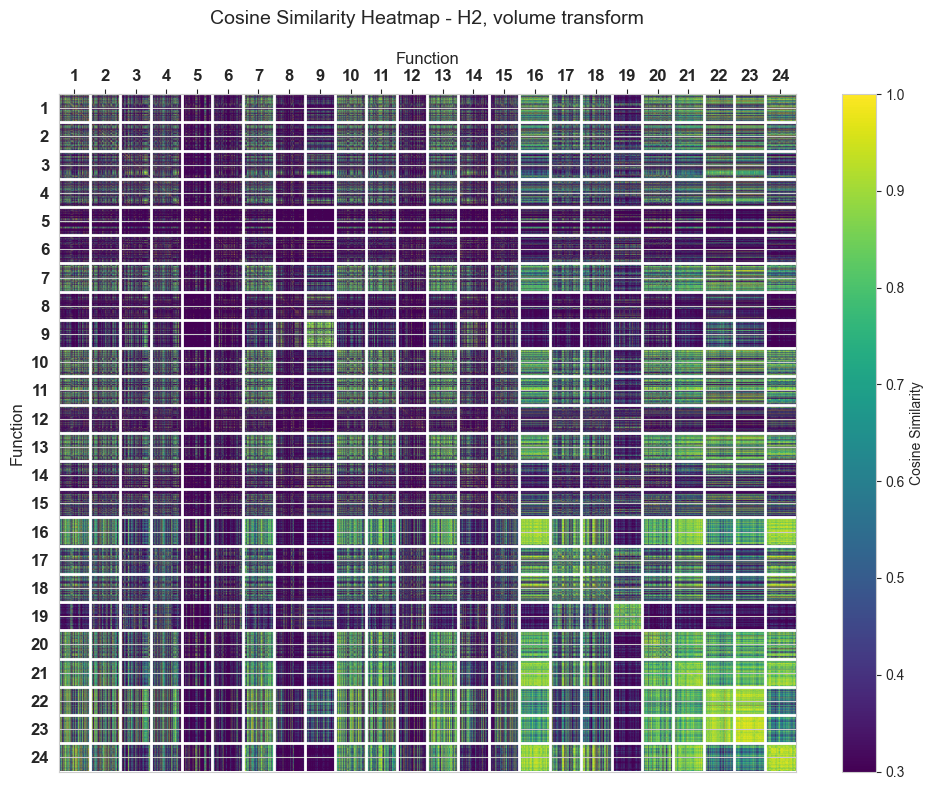

In [7]:
plot_cosine_similarity_heatmap(
    h2_volume_sim,
    group_size=100,
    title="Cosine Similarity Heatmap - H2, volume transform",
    vmin=0.3
)

In [8]:
for feat in [h0_axis, h1_axis, h2_axis, h0_volume, h1_volume, h2_volume]:
    print(np.asmatrix(feat).shape)

(2400, 100)
(2400, 10000)
(2400, 10000)
(2400, 100)
(2400, 10000)
(2400, 10000)


In [9]:
tla_feat = np.concatenate([h0_axis, h1_axis, h2_axis, h0_volume, h1_volume, h2_volume], axis=1)
tla_feat.shape

(2400, 40200)

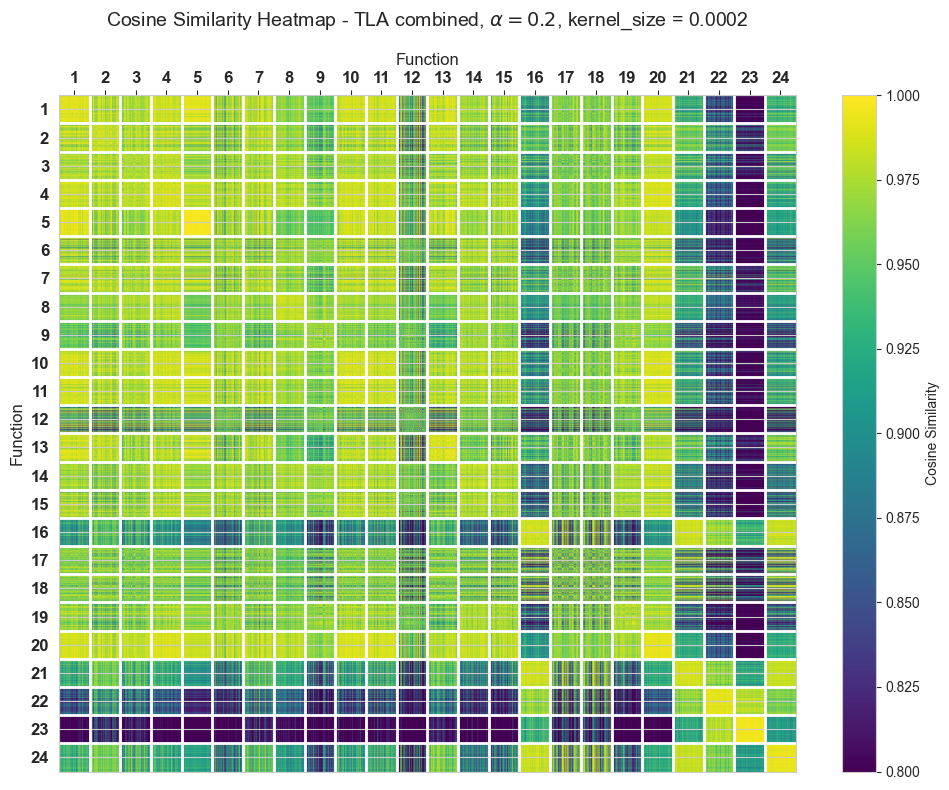

In [10]:
tla_feat_sim = cosine_similarity(tla_feat)
plot_cosine_similarity_heatmap(
    tla_feat_sim,
    group_size=100,
    title="Cosine Similarity Heatmap - TLA combined, $\\alpha = 0.2$, kernel_size = 0.0002",
    vmin =0.8
)

In [11]:
!pip install pflacco


[notice] A new release of pip is available: 24.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [12]:
suite = cocoex.Suite(
    "bbob",
    f"year: 2009 instances: 1-100",
    f"function_indices: 1-24 " f"dimensions: 2 " f"instance_indices: 1-100 ",
)

In [23]:
from pflacco.classical_ela_features import *
from pflacco.sampling import create_initial_sample
from utils import calculate_basic_features


basic_feats = []
cm_angle_feats = []
cm_grad_feats = []
disp_feats = []
ela_distr_feats = []
# ela_level_feats = []
ela_meta_feats = []
ic_feats = []
# limo_feats = []
nbc_feats = []
pca_feats = []

for problem in tqdm(suite):
    X = create_initial_sample(2, lower_bound=-5, upper_bound=5)
    y = X.apply(lambda x: problem(x), axis=1)

    # Generate ELA features
    ela_meta = calculate_ela_meta(X, y)
    ela_distr = calculate_ela_distribution(X, y)
    # ela_level = calculate_ela_level(X, y)
    nbc = calculate_nbc(X, y)
    disp = calculate_dispersion(X, y)
    ic = calculate_information_content(X, y, seed = 100)
    # limo = calculate_limo(X, y, lower_bound=-5, upper_bound=5)
    pca = calculate_pca(X, y)
    cm_angle = calculate_cm_angle(X, y, lower_bound=-5, upper_bound=5)
    cm_grad = calculate_cm_grad(X, y, lower_bound=-5, upper_bound=5)
    basic = calculate_basic_features(X, y, lower_bounds=-5, upper_bounds=5)

    # Append all features to a list
    basic_feats.append(basic)
    cm_angle_feats.append(cm_angle)
    cm_grad_feats.append(cm_grad)
    disp_feats.append(disp)
    ela_distr_feats.append(ela_distr)
    # ela_level_feats.append(ela_level)
    ela_meta_feats.append(ela_meta)
    ic_feats.append(ic)
    # limo_feats.append(limo)
    nbc_feats.append(nbc)
    pca_feats.append(pca)


100%|██████████| 2400/2400 [10:15<00:00,  3.90it/s]


In [25]:
pca = PCA(n_components=10)
tla_feat_pca = pca.fit_transform(tla_feat)
tla_feat_pca.shape

(2400, 10)

In [26]:
np.asmatrix(basic_feats).shape

(2400, 15)

Total features: 89
Total instances: 2400
Removed 0 features with NaN/Inf values

Calculating Pearson correlation matrix...

Feature counts by group:
  Basic: 15 features
  CM Angle: 9 features
  CM Grad: 3 features
  DISP: 17 features
  ELA Distr: 4 features
  ELA Meta: 10 features
  IC: 6 features
  NBC: 6 features
  PCA: 9 features
  TLA: 10 features


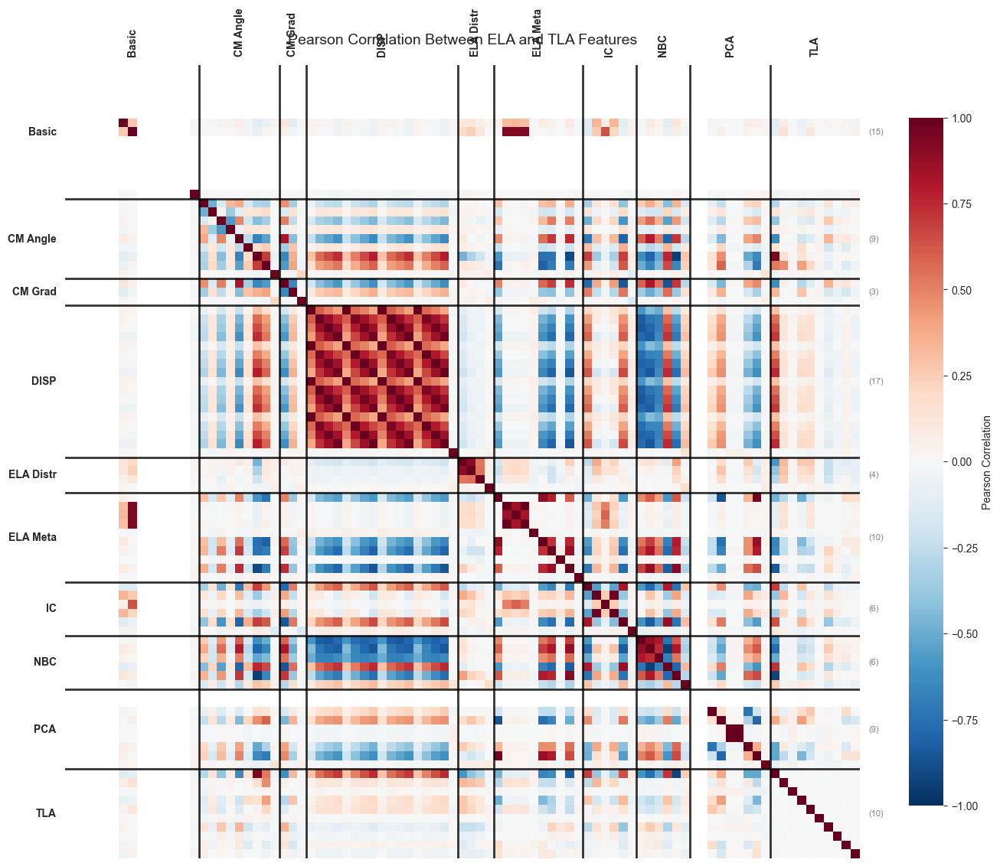

In [27]:
# Step 1: Prepare all features (same as before)
def features_to_dataframe(feature_list, group_name):
    """Convert a list of feature dictionaries/arrays to a DataFrame"""
    if len(feature_list) == 0:
        return pd.DataFrame()

    if isinstance(feature_list[0], dict):
        df = pd.DataFrame(feature_list)
    elif isinstance(feature_list[0], pd.DataFrame):
        df = pd.concat(feature_list, ignore_index=True)
    elif isinstance(feature_list[0], np.ndarray):
        df = pd.DataFrame(feature_list)
    else:
        df = pd.DataFrame(feature_list)

    # Add group prefix to column names
    df.columns = [f'{group_name}.{col}' for col in df.columns]
    return df


basic_df = features_to_dataframe(basic_feats, 'Basic')
cm_angle_df = features_to_dataframe(cm_angle_feats, 'CM_Angle')
cm_grad_df = features_to_dataframe(cm_grad_feats, 'CM_Grad')
disp_df = features_to_dataframe(disp_feats, 'DISP')
ela_distr_df = features_to_dataframe(ela_distr_feats, 'ELA_Distr')
ela_meta_df = features_to_dataframe(ela_meta_feats, 'ELA_Meta')
ic_df = features_to_dataframe(ic_feats, 'IC')
nbc_df = features_to_dataframe(nbc_feats, 'NBC')
pca_df = features_to_dataframe(pca_feats, 'PCA')

tla_df = pd.DataFrame(
    tla_feat_pca,
    columns=[f'TLA.{i+1}' for i in range(tla_feat_pca.shape[1])]
)

# Combine all features

all_features_list = [
    basic_df, cm_angle_df, cm_grad_df, disp_df,
    ela_distr_df, ela_meta_df, ic_df, nbc_df,
    pca_df, tla_df
]

# Filter out empty DataFrames
all_features_list = [df for df in all_features_list if not df.empty]

# Concatenate all features
df_all_features = pd.concat(all_features_list, axis=1)

print(f"Total features: {df_all_features.shape[1]}")
print(f"Total instances: {df_all_features.shape[0]}")

# Handle missing/infinite values
df_all_features = df_all_features.replace([np.inf, -np.inf], np.nan)
initial_cols = df_all_features.shape[1]
df_all_features = df_all_features.dropna(axis=1)
final_cols = df_all_features.shape[1]
print(f"Removed {initial_cols - final_cols} features with NaN/Inf values")

# Calculate correlation matrix
print("\nCalculating Pearson correlation matrix...")
correlation_matrix = df_all_features.corr(method='pearson')

# Determine feature group information
feature_group_info = []
feature_group_names_display = ['Basic', 'CM Angle', 'CM Grad', 'DISP',
                                'ELA Distr', 'ELA Meta', 'IC', 'NBC',
                                'PCA', 'TLA']
feature_group_prefixes = ['Basic.', 'CM_Angle.', 'CM_Grad.', 'DISP.',
                          'ELA_Distr.', 'ELA_Meta.', 'IC.', 'NBC.',
                          'PCA.', 'TLA.']

for prefix, display_name in zip(feature_group_prefixes, feature_group_names_display):
    cols_in_group = [col for col in correlation_matrix.columns if col.startswith(prefix)]
    if len(cols_in_group) > 0:
        feature_group_info.append({
            'name': display_name,
            'prefix': prefix,
            'size': len(cols_in_group),
            'columns': cols_in_group
        })

print(f"\nFeature counts by group:")
for group in feature_group_info:
    print(f"  {group['name']}: {group['size']} features")

# Calculate cumulative positions for group boundaries
cumulative_positions = [0]
for group in feature_group_info:
    cumulative_positions.append(cumulative_positions[-1] + group['size'])

fig, ax = plt.subplots(figsize=(14, 12))
# Create the heatmap
sns.heatmap(
    correlation_matrix,
    cmap='RdBu_r',
    center=0,
    vmin=-1,
    vmax=1,
    square=True,
    linewidths=0,
    cbar_kws={"shrink": 0.8, "label": "Pearson Correlation"},
    xticklabels=False,
    yticklabels=False,
    ax=ax
)

# Step 7: Add feature group boundary lines
for pos in cumulative_positions[1:-1]:
    ax.axhline(y=pos, color='black', linewidth=2, alpha=0.8)
    ax.axvline(x=pos, color='black', linewidth=2, alpha=0.8)

# Step 8: Add feature group labels
# Labels on the left (Y-axis)
for i, group in enumerate(feature_group_info):
    mid_point = (cumulative_positions[i] + cumulative_positions[i+1]) / 2
    ax.text(-1, mid_point, group['name'],
            rotation=0,
            va='center',
            ha='right',
            fontsize=10,
            fontweight='bold')

# Labels on the top (X-axis)
for i, group in enumerate(feature_group_info):
    mid_point = (cumulative_positions[i] + cumulative_positions[i+1]) / 2
    ax.text(mid_point, -1, group['name'],
            rotation=90,
            ha='center',
            va='bottom',
            fontsize=10,
            fontweight='bold')

# Add count labels (optional - shows number of features in each group)
for i, group in enumerate(feature_group_info):
    mid_point = (cumulative_positions[i] + cumulative_positions[i+1]) / 2
    # On the right side
    ax.text(correlation_matrix.shape[1] + 1, mid_point, f"({group['size']})",
            rotation=0,
            va='center',
            ha='left',
            fontsize=8,
            color='gray')

plt.title('Pearson Correlation Between ELA and TLA Features', fontsize=14, pad=20)
plt.tight_layout()
# plt.savefig('pearson_correlation_labeled.png', dpi=300, bbox_inches='tight')
plt.show()
